PROJECT : EnviroScan:AI-Powered Pollution Source Identifier using  Geospatial Analytics 

*** Requried Libraries ***

In [90]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from geopy.distance import geodesic
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
from sklearn.preprocessing import LabelEncoder
import math
import os
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import joblib

*** Loading a Dataset ***

In [2]:
df = pd.read_csv(r"D:\AI-EnviroProject\india_merged_all_rows_columns.csv")

In [3]:
# Show first few rows
df.head()

,location_id,city,latitude,longitude,PM25 AQ,PM25 AQI Category,PM10 AQ,PM10 AQI Category,CO AQ,CO AQI Category,...,Road_Count,Industrial_Count,Farmland_Count,Landfill_Count,Dump_Site_Count,Distance_to_Nearest_Road_m,Distance_to_Nearest_Industrial_m,Distance_to_Nearest_Farmland_m,Distance_to_Nearest_Landfill_m,Distance_to_Nearest_Dump_m
0,16173235,Mumbai,19.054999,72.869203,121.12,Moderate,129.58,Moderate,390.88,Very Poor,...,938.0,30.0,2.0,0.0,0.0,23.60,51.03,1878.86,NaN,NaN
1,16173236,New Delhi,28.613895,77.209006,170.13,Moderate,201.91,Poor,834.69,Severe,...,1205.0,0.0,0.0,0.0,3.0,1.50,NaN,NaN,NaN,2068.80
2,16174445,Pune,18.521374,73.854507,116.72,Moderate,123.54,Moderate,394.57,Very Poor,...,1899.0,5.0,2.0,0.0,1.0,24.72,1355.70,1793.35,NaN,563.07
3,30609910,Shrirampur,19.619971,74.654694,43.48,Good,49.50,Good,331.10,Very Poor,...,324.0,3.0,11.0,0.0,0.0,0.00,1045.90,814.50,NaN,NaN
4,30612110,Vaduj,17.595082,74.450466,135.40,Moderate,144.95,Moderate,490.58,Severe,...,112.0,0.0,0.0,0.0,0.0,0.76,NaN,NaN,NaN,NaN


In [4]:
# Show shape
df.shape

(4690, 32)

In [5]:
# Show columns
df.columns

Index(['location_id', 'city', 'latitude', 'longitude', 'PM25 AQ',
       'PM25 AQI Category', 'PM10 AQ', 'PM10 AQI Category', 'CO AQ',
       'CO AQI Category', 'NO2 AQ', 'NO2 AQI Category', 'SO2 AQ',
       'SO2 AQI Category', 'O3 AQ', 'O3 AQI Category', 'AQI', 'temperature',
       'humidity', 'wind_speed', 'wind_deg', 'timestamp', 'Road_Count',
       'Industrial_Count', 'Farmland_Count', 'Landfill_Count',
       'Dump_Site_Count', 'Distance_to_Nearest_Road_m',
       'Distance_to_Nearest_Industrial_m', 'Distance_to_Nearest_Farmland_m',
       'Distance_to_Nearest_Landfill_m', 'Distance_to_Nearest_Dump_m'],
      dtype='object')

In [6]:
df.describe()

,location_id,latitude,longitude,PM25 AQ,PM10 AQ,CO AQ,NO2 AQ,SO2 AQ,O3 AQ,AQI,...,Road_Count,Industrial_Count,Farmland_Count,Landfill_Count,Dump_Site_Count,Distance_to_Nearest_Road_m,Distance_to_Nearest_Industrial_m,Distance_to_Nearest_Farmland_m,Distance_to_Nearest_Landfill_m,Distance_to_Nearest_Dump_m
count,4.690000e+03,4690.000000,4690.000000,4690.000000,4690.000000,4690.000000,4690.000000,4690.000000,4690.000000,4690.000000,...,4645.000000,4645.000000,4645.000000,4645.000000,4645.000000,4645.00000,1525.000000,932.000000,125.000000,88.000000
mean,2.832999e+09,21.678572,79.614550,125.879755,143.365414,585.810768,12.301631,7.823936,94.379714,4.394883,...,303.871044,0.932185,2.293649,0.027126,0.020022,66.55774,1003.269521,922.320311,883.543600,696.174659
std,3.192699e+09,6.434239,5.661706,89.346693,97.593979,349.932945,8.410628,8.151646,32.514321,0.888863,...,477.096721,3.257458,14.148662,0.393362,0.317159,141.32814,645.006868,636.758534,768.671973,807.707433
min,1.617324e+07,8.079252,68.827060,5.240000,5.980000,87.470000,0.210000,0.110000,11.400000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,2.457693e+08,16.879538,75.775575,57.452500,66.017500,327.085000,6.870000,3.590000,75.335000,4.000000,...,24.000000,0.000000,0.000000,0.000000,0.000000,13.84000,466.370000,388.305000,0.000000,0.000000
50%,1.732712e+09,22.860068,77.957474,100.220000,116.660000,463.440000,11.450000,5.605000,91.165000,5.000000,...,111.000000,0.000000,0.000000,0.000000,0.000000,32.05000,916.480000,813.810000,894.220000,340.400000
75%,4.237044e+09,26.505043,82.201475,169.330000,197.990000,772.540000,16.050000,8.430000,111.740000,5.000000,...,340.000000,1.000000,0.000000,0.000000,0.000000,67.22000,1487.740000,1394.340000,1469.790000,1539.057500
max,1.339296e+10,34.586831,97.016552,480.340000,566.180000,2650.020000,85.370000,90.640000,228.870000,5.000000,...,4264.000000,112.000000,426.000000,24.000000,17.000000,2489.42000,2737.370000,2732.240000,2779.760000,2325.980000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4690 entries, 0 to 4689
Data columns (total 32 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   location_id                       4690 non-null   int64  
 1   city                              4645 non-null   object 
 2   latitude                          4690 non-null   float64
 3   longitude                         4690 non-null   float64
 4   PM25 AQ                           4690 non-null   float64
 5   PM25 AQI Category                 4690 non-null   object 
 6   PM10 AQ                           4690 non-null   float64
 7   PM10 AQI Category                 4690 non-null   object 
 8   CO AQ                             4690 non-null   float64
 9   CO AQI Category                   4690 non-null   object 
 10  NO2 AQ                            4690 non-null   float64
 11  NO2 AQI Category                  4690 non-null   object 
 12  SO2 AQ

In [10]:
df.isnull().sum()

location_id                            0
city                                  45
latitude                               0
longitude                              0
PM25 AQ                                0
PM25 AQI Category                      0
PM10 AQ                                0
PM10 AQI Category                      0
CO AQ                                  0
CO AQI Category                        0
NO2 AQ                                 0
NO2 AQI Category                       0
SO2 AQ                                 0
SO2 AQI Category                       0
O3 AQ                                  0
O3 AQI Category                        0
AQI                                    0
temperature                            0
humidity                               0
wind_speed                             0
wind_deg                               0
timestamp                              0
Road_Count                            45
Industrial_Count                      45
Farmland_Count  

In [12]:
geolocator = Nominatim(user_agent="aqi_spatial_project")

reverse = RateLimiter(
    geolocator.reverse,
    min_delay_seconds=1,      # avoids IP ban
    max_retries=2,
    swallow_exceptions=True
)

def extract_city(lat, lon):
    location = reverse((lat, lon), language="en")
    if location is None:
        return None
    
    address = location.raw.get("address", {})
    return (
        address.get("city")
        or address.get("town")
        or address.get("village")
        or address.get("municipality")
        or address.get("county")
    )

In [15]:
# Fill the city column
df['city'] = df.apply(
    lambda r: extract_city(r['latitude'], r['longitude'])
    if pd.isna(r['city']) else r['city'],
    axis=1
)

In [16]:
df['city'] = df['city'].fillna("Unknown_Region")


In [18]:
le = LabelEncoder()
df['city_encoded'] = le.fit_transform(df['city'])


In [19]:
print(df['city'].isna().sum())        # should be 0
print(df[['city','city_encoded']].head())

0
         city  city_encoded
0      Mumbai          2771
1   New Delhi          2983
2        Pune          3378
3  Shrirampur          3846
4       Vaduj          4330


In [20]:
df.isnull().sum()

location_id                            0
city                                   0
latitude                               0
longitude                              0
PM25 AQ                                0
PM25 AQI Category                      0
PM10 AQ                                0
PM10 AQI Category                      0
CO AQ                                  0
CO AQI Category                        0
NO2 AQ                                 0
NO2 AQI Category                       0
SO2 AQ                                 0
SO2 AQI Category                       0
O3 AQ                                  0
O3 AQI Category                        0
AQI                                    0
temperature                            0
humidity                               0
wind_speed                             0
wind_deg                               0
timestamp                              0
Road_Count                            45
Industrial_Count                      45
Farmland_Count  

In [22]:
count_cols = [
    'Road_Count',
    'Industrial_Count',
    'Farmland_Count',
    'Landfill_Count',
    'Dump_Site_Count'
]
distance_cols = [
    'Distance_to_Nearest_Road_m',
    'Distance_to_Nearest_Industrial_m',
    'Distance_to_Nearest_Farmland_m',
    'Distance_to_Nearest_Landfill_m',
    'Distance_to_Nearest_Dump_m'
]

In [23]:
df[count_cols + distance_cols].isna().sum()

Road_Count                            45
Industrial_Count                      45
Farmland_Count                        45
Landfill_Count                        45
Dump_Site_Count                       45
Distance_to_Nearest_Road_m            45
Distance_to_Nearest_Industrial_m    3165
Distance_to_Nearest_Farmland_m      3758
Distance_to_Nearest_Landfill_m      4565
Distance_to_Nearest_Dump_m          4602
dtype: int64

In [24]:
# Fill COUNT columns 
df[count_cols] = df[count_cols].fillna(0)

In [25]:
# Fill DISTANCE columns
for col in distance_cols:
    if df[col].notna().any():
        fill_value = df[col].max() + 1000
    else:
        fill_value = 50000   # fallback if column is fully NaN

    df[col] = df[col].fillna(fill_value)

In [26]:
df[count_cols + distance_cols].isna().sum()

Road_Count                          0
Industrial_Count                    0
Farmland_Count                      0
Landfill_Count                      0
Dump_Site_Count                     0
Distance_to_Nearest_Road_m          0
Distance_to_Nearest_Industrial_m    0
Distance_to_Nearest_Farmland_m      0
Distance_to_Nearest_Landfill_m      0
Distance_to_Nearest_Dump_m          0
dtype: int64

In [27]:
df.isnull().sum()

location_id                         0
city                                0
latitude                            0
longitude                           0
PM25 AQ                             0
PM25 AQI Category                   0
PM10 AQ                             0
PM10 AQI Category                   0
CO AQ                               0
CO AQI Category                     0
NO2 AQ                              0
NO2 AQI Category                    0
SO2 AQ                              0
SO2 AQI Category                    0
O3 AQ                               0
O3 AQI Category                     0
AQI                                 0
temperature                         0
humidity                            0
wind_speed                          0
wind_deg                            0
timestamp                           0
Road_Count                          0
Industrial_Count                    0
Farmland_Count                      0
Landfill_Count                      0
Dump_Site_Co

In [38]:
df.to_csv(r"D:\AI-EnviroProject\cleaned_aqi_dataset.csv", index=False)

*** OUTLIERS ***

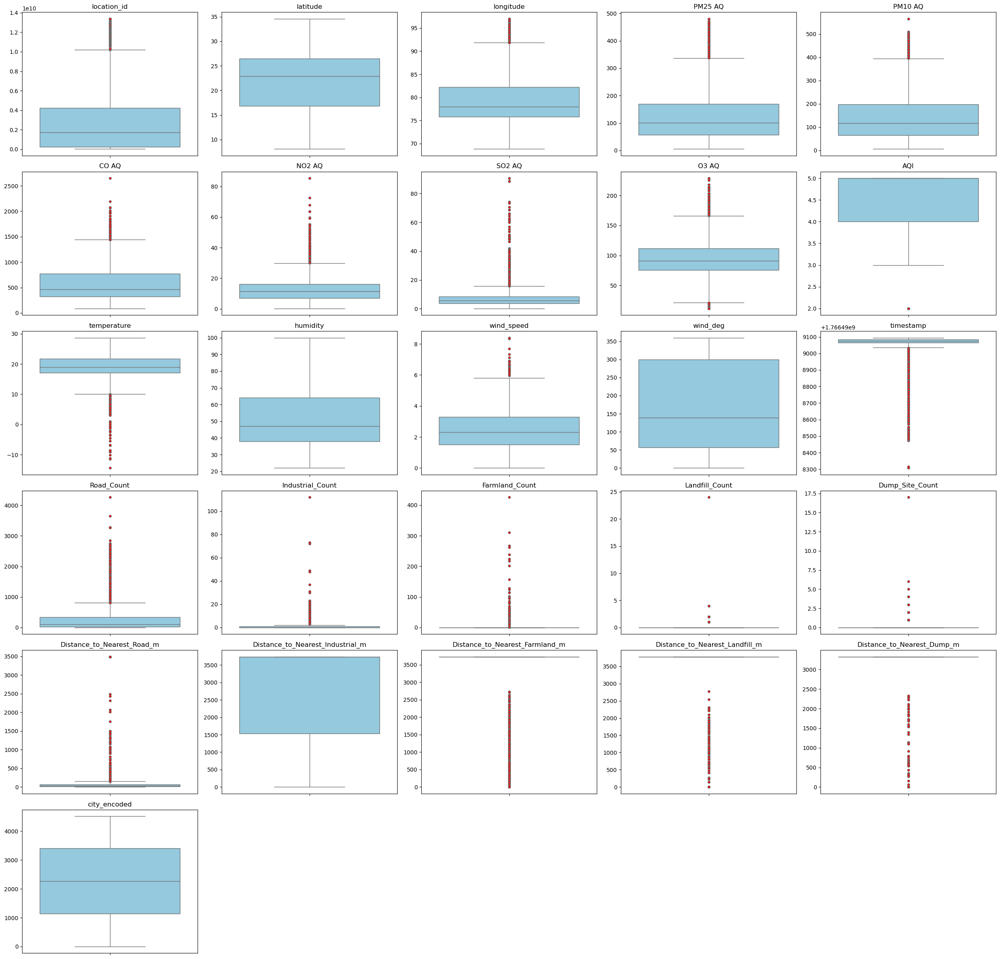

In [37]:
numeric_cols = df.select_dtypes(include='number').columns
n_cols_per_row = 5
n_rows = math.ceil(len(numeric_cols) / n_cols_per_row)

fig, axes = plt.subplots(n_rows, n_cols_per_row, figsize=(5*n_cols_per_row, 4*n_rows))

for i, col in enumerate(numeric_cols):
    row = i // n_cols_per_row
    col_idx = i % n_cols_per_row
    sns.boxplot(y=df[col], ax=axes[row, col_idx], color='skyblue',
                flierprops=dict(marker='o', markerfacecolor='red', markersize=4))
    axes[row, col_idx].set_title(col)
    axes[row, col_idx].set_ylabel('')  # optional: remove ylabel for space

# Remove empty subplots if any
for j in range(i+1, n_rows*n_cols_per_row):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()


In [59]:
numeric_cols = df.select_dtypes(include='number').columns

# Function to remove outliers using IQR
def remove_outliers(df, cols):
    df_clean = df.copy()
    for col in cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        df_clean = df_clean[(df_clean[col] >= Q1 - 1.5*IQR) & (df_clean[col] <= Q3 + 1.5*IQR)]
    return df_clean

df_no_outliers = remove_outliers(df, numeric_cols)
print(f"Original rows: {len(df)}, After removing outliers: {len(df_no_outliers)}")

Original rows: 4690, After removing outliers: 1926


In [62]:
col_mask = (df[col] >= Q1 - 3*IQR) & (df[col] <= Q3 + 3*IQR)

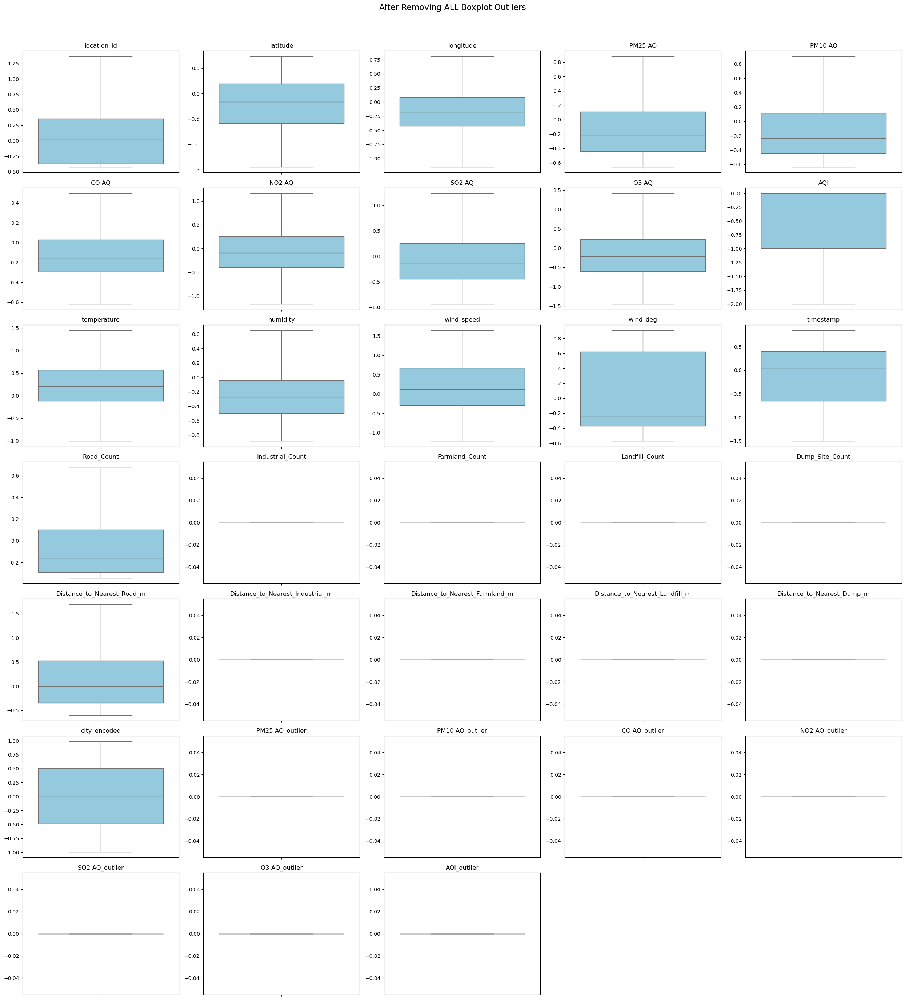

In [66]:
import seaborn as sns
import matplotlib.pyplot as plt
import math

n_cols_per_row = 5
n_rows = math.ceil(len(numeric_cols) / n_cols_per_row)

fig, axes = plt.subplots(n_rows, n_cols_per_row, figsize=(5*n_cols_per_row, 4*n_rows))

for i, col in enumerate(numeric_cols):
    row = i // n_cols_per_row
    col_idx = i % n_cols_per_row
    sns.boxplot(y=df_no_outliers[col], ax=axes[row, col_idx], color='skyblue')
    axes[row, col_idx].set_title(col)
    axes[row, col_idx].set_ylabel('')

# Remove empty subplots
for j in range(i+1, n_rows*n_cols_per_row):
    fig.delaxes(axes.flatten()[j])

plt.suptitle("After Removing ALL Boxplot Outliers", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


*** VISUALIZATION ***

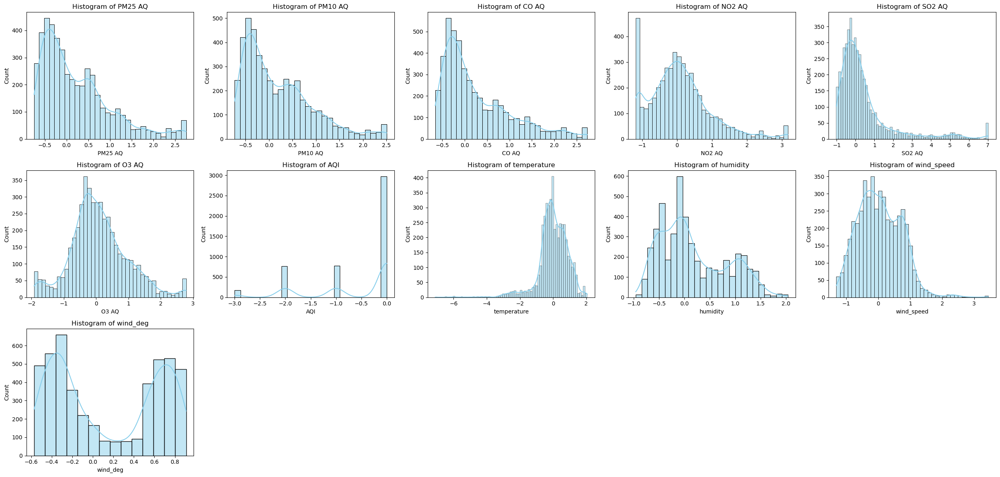

In [72]:
# Numeric pollution and weather columns
pollution_weather_cols = ['PM25 AQ', 'PM10 AQ', 'CO AQ', 'NO2 AQ', 'SO2 AQ', 'O3 AQ', 'AQI',
                          'temperature', 'humidity', 'wind_speed', 'wind_deg']

n_cols_per_row = 5
n_rows = math.ceil(len(pollution_weather_cols) / n_cols_per_row)

fig, axes = plt.subplots(n_rows, n_cols_per_row, figsize=(5*n_cols_per_row, 4*n_rows))

for i, col in enumerate(pollution_weather_cols):
    row = i // n_cols_per_row
    col_idx = i % n_cols_per_row
    sns.histplot(df[col], kde=True, ax=axes[row, col_idx], color='skyblue')
    axes[row, col_idx].set_title(f"Histogram of {col}", fontsize=12)  # Title for each plot

# Remove empty subplots
for j in range(i+1, n_rows*n_cols_per_row):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

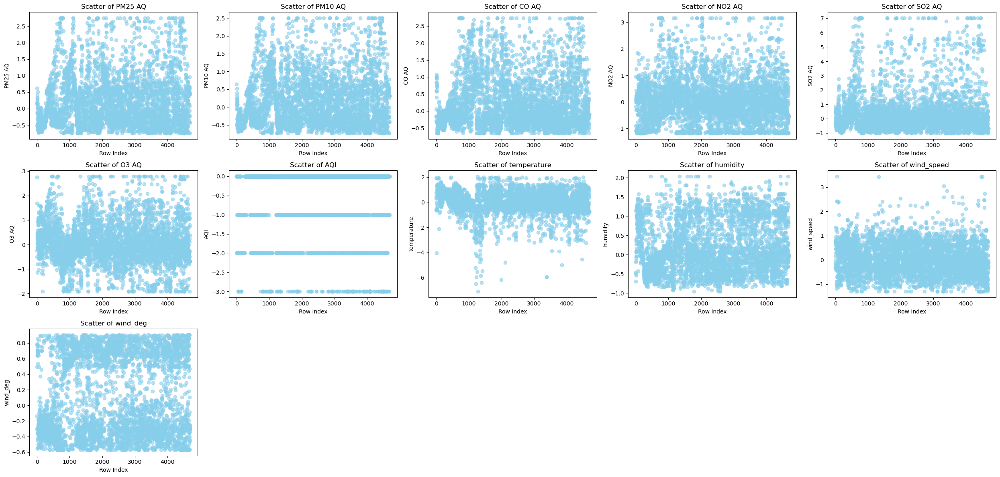

In [75]:
pollution_weather_cols = ['PM25 AQ', 'PM10 AQ', 'CO AQ', 'NO2 AQ', 'SO2 AQ', 'O3 AQ', 'AQI',
                          'temperature', 'humidity', 'wind_speed', 'wind_deg']

n_cols_per_row = 5
n_rows = math.ceil(len(pollution_weather_cols) / n_cols_per_row)

fig, axes = plt.subplots(n_rows, n_cols_per_row, figsize=(5*n_cols_per_row, 4*n_rows))

for i, col in enumerate(pollution_weather_cols):
    row = i // n_cols_per_row
    col_idx = i % n_cols_per_row
    axes[row, col_idx].scatter(df.index, df[col], color='skyblue', alpha=0.6)
    axes[row, col_idx].set_title(f"Scatter of {col}")
    axes[row, col_idx].set_xlabel("Row Index")
    axes[row, col_idx].set_ylabel(col)

# Remove empty subplots
for j in range(i+1, n_rows*n_cols_per_row):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

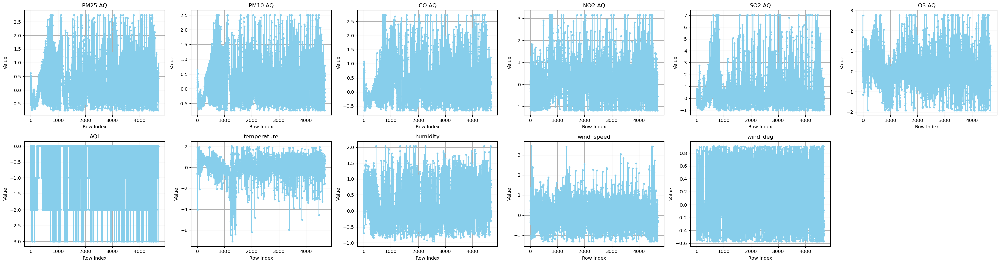

In [77]:
pollution_weather_cols = ['PM25 AQ', 'PM10 AQ', 'CO AQ', 'NO2 AQ', 'SO2 AQ', 'O3 AQ', 'AQI',
                          'temperature', 'humidity', 'wind_speed', 'wind_deg']

n_cols_per_row = 6
n_rows = math.ceil(len(pollution_weather_cols) / n_cols_per_row)

fig, axes = plt.subplots(n_rows, n_cols_per_row, figsize=(5*n_cols_per_row, 4*n_rows))

for i, col in enumerate(pollution_weather_cols):
    row = i // n_cols_per_row
    col_idx = i % n_cols_per_row
    axes[row, col_idx].plot(df[col], color='skyblue', marker='o', linestyle='-', markersize=3)
    axes[row, col_idx].set_title(col)
    axes[row, col_idx].set_xlabel("Row Index")
    axes[row, col_idx].set_ylabel("Value")
    axes[row, col_idx].grid(True)

# Remove empty subplots if any
for j in range(i+1, n_rows*n_cols_per_row):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

*** Feature Engineering ***

In [78]:
# Standardize timestamps, GPS coordinates, and pollutant units
# Convert timestamp to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'], errors='coerce')

# Ensure latitude & longitude are numeric
df['latitude'] = pd.to_numeric(df['latitude'], errors='coerce')
df['longitude'] = pd.to_numeric(df['longitude'], errors='coerce')
print(" timestamps and GPS standardized.")

 timestamps and GPS standardized.


In [79]:
# Normalize pollutant and weather values
pollution_cols = ['PM25 AQ', 'PM10 AQ', 'CO AQ', 'NO2 AQ', 'SO2 AQ', 'O3 AQ', 'AQI']
weather_cols = ['temperature', 'humidity', 'wind_speed', 'wind_deg']

cols_to_normalize = pollution_cols + weather_cols

scaler = MinMaxScaler()
df[cols_to_normalize] = scaler.fit_transform(df[cols_to_normalize])

print(" pollution and weather columns normalized (0-1).")

 pollution and weather columns normalized (0-1).


In [80]:
# Ensure spatial proximity features are numeric and normalized
distance_cols = [
    'Distance_to_Nearest_Road_m',
    'Distance_to_Nearest_Industrial_m',
    'Distance_to_Nearest_Farmland_m',
    'Distance_to_Nearest_Landfill_m',
    'Distance_to_Nearest_Dump_m'
]

# Convert to numeric
for col in distance_cols:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# normalize distances
scaler_dist = MinMaxScaler()
df[distance_cols] = scaler_dist.fit_transform(df[distance_cols])

print("spatial distance features numeric and normalized.")

spatial distance features numeric and normalized.


In [81]:
# Temporal Features
# Extract temporal features
df['hour'] = df['timestamp'].dt.hour
df['day_of_week'] = df['timestamp'].dt.dayofweek  # Monday=0, Sunday=6
df['month'] = df['timestamp'].dt.month
df['season'] = df['month'] % 12 // 3 + 1  # 1=Winter, 2=Spring, 3=Summer, 4=Fall

# Optional: map season numbers to names
season_map = {1: 'Winter', 2: 'Spring', 3: 'Summer', 4: 'Fall'}
df['season'] = df['season'].map(season_map)

print("temporal features (hour, day_of_week, month, season) added.")

temporal features (hour, day_of_week, month, season) added.


In [82]:
# Save the cleaned and feature-engineered DataFrame to CSV
output_file = r"D:\AI-EnviroProject\cleaned_feature_engineered_data.csv"
df.to_csv(output_file, index=False)

print(f"File saved successfully as {output_file}")

File saved successfully as D:\AI-EnviroProject\cleaned_feature_engineered_data.csv


*** Source Labeling and Simulation ***

In [132]:
import pandas as pd

# =====================================
# 1. LOAD DATA
# =====================================
df = pd.read_csv(r"D:\AI-EnviroProject\cleaned_feature_engineered_data.csv")

# =====================================
# 2. DATA-DRIVEN THRESHOLDS (0–1 SCALE)
# =====================================
# Pollution thresholds
no2_high = df['NO2 AQ'].quantile(0.75)
so2_high = df['SO2 AQ'].quantile(0.75)
pm25_mid = df['PM25 AQ'].quantile(0.65)
co_high = df['CO AQ'].quantile(0.75)

# Distance thresholds (normalized)
road_near = df['Distance_to_Nearest_Road_m'].quantile(0.25)
industry_near = df['Distance_to_Nearest_Industrial_m'].quantile(0.25)
farm_near = df['Distance_to_Nearest_Farmland_m'].quantile(0.50)  # looser for agri

print("Thresholds used:")
print("NO2 high:", no2_high)
print("SO2 high:", so2_high)
print("PM25 mid:", pm25_mid)
print("CO high :", co_high)
print("Road near:", road_near)
print("Industry near:", industry_near)
print("Farm near:", farm_near)

Thresholds used:
NO2 high: 0.3520482962359796
SO2 high: 0.1667483088619963
PM25 mid: 0.28248727103247034
CO high : 0.3227195153631055
Road near: 0.0038745694126817
Industry near: 0.410451734776059
Farm near: 1.0


In [133]:
# =====================================
# 3. SOURCE LABELING FUNCTION
# =====================================
def label_pollution_source(row):
    """
    Assign pollution source labels using normalized (0–1) features.
    Priority order matters.
    """

    # Vehicular: near road + high NO2
    if (
        row['Distance_to_Nearest_Road_m'] <= road_near and
        row['NO2 AQ'] >= no2_high
    ):
        return 'Vehicular'

    # Industrial: near industry + high SO2
    elif (
        row['Distance_to_Nearest_Industrial_m'] <= industry_near and
        row['SO2 AQ'] >= so2_high
    ):
        return 'Industrial'

    # Agricultural: mid/high PM2.5 + dry season + moderately near farmland
    elif (
        row['PM25 AQ'] >= pm25_mid and
        row['season'] in ['Summer', 'Spring'] and
        row['Distance_to_Nearest_Farmland_m'] <= farm_near
         ):
        return 'Agricultural'

    # Burning: high CO + dry season
    elif (
        row['CO AQ'] >= co_high and
        row['season'] in ['Summer', 'Fall']
    ):
        return 'Burning'

    # Default
    else:
        return 'Natural'

In [135]:
# =====================================
# 4. APPLY LABELING
# =====================================
df['Source_Label'] = df.apply(label_pollution_source, axis=1)

# =====================================
# 5. VERIFY RESULTS
# =====================================
print("\nSource label counts:")
print(df['Source_Label'].value_counts())

# =====================================
# 6. SAVE UPDATED DATASET
# =====================================
output_path = r"D:\AI-EnviroProject\final_labeled_dataset.csv"
df.to_csv(output_path, index=False)

print(f"\n✅ Updated file saved to:\n{output_path}")


Source label counts:
Source_Label
Natural       3179
Industrial     227
Vehicular      219
Name: count, dtype: int64

✅ Updated file saved to:
D:\AI-EnviroProject\final_labeled_dataset.csv


*** Model Training and Source Prediction ***

In [92]:
!pip install xgboost

   ---------------------------------------- 0.0/72.0 MB ? eta -:--:--
   ---------------------------------------- 0.3/72.0 MB ? eta -:--:--
   - -------------------------------------- 1.8/72.0 MB 7.2 MB/s eta 0:00:10
   -- ------------------------------------- 3.7/72.0 MB 8.0 MB/s eta 0:00:09
   -- ------------------------------------- 5.0/72.0 MB 7.5 MB/s eta 0:00:09
   --- ------------------------------------ 6.8/72.0 MB 7.7 MB/s eta 0:00:09
   ---- ----------------------------------- 8.1/72.0 MB 7.6 MB/s eta 0:00:09
   ----- ---------------------------------- 10.0/72.0 MB 7.7 MB/s eta 0:00:09
   ------ --------------------------------- 11.5/72.0 MB 7.8 MB/s eta 0:00:08
   ------- -------------------------------- 13.6/72.0 MB 7.9 MB/s eta 0:00:08
   -------- ------------------------------- 15.5/72.0 MB 8.0 MB/s eta 0:00:08
   --------- ------------------------------ 17.0/72.0 MB 8.1 MB/s eta 0:00:07
   ---------- ----------------------------- 18.9/72.0 MB 8.1 MB/s eta 0:00:07
   ----

In [136]:
# Random Forest 
# Load dataset
df = pd.read_csv(r"D:\AI-EnviroProject\final_labeled_dataset.csv")

# Encode target labels
le = LabelEncoder()
df['Source_Label_encoded'] = le.fit_transform(df['Source_Label'])

# Features and target
features = ['PM25 AQ', 'PM10 AQ', 'CO AQ', 'NO2 AQ', 'SO2 AQ', 'O3 AQ', 'AQI',
            'temperature', 'humidity', 'wind_speed', 'wind_deg',
            'Road_Count', 'Industrial_Count', 'Farmland_Count', 'Landfill_Count', 'Dump_Site_Count',
            'Distance_to_Nearest_Road_m', 'Distance_to_Nearest_Industrial_m',
            'Distance_to_Nearest_Farmland_m', 'Distance_to_Nearest_Landfill_m', 'Distance_to_Nearest_Dump_m',
            'hour', 'day_of_week']

X = df[features]
y = df['Source_Label_encoded']

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}
rf = RandomForestClassifier(random_state=42)
grid = GridSearchCV(rf, param_grid, cv=3, scoring='f1_weighted', n_jobs=-1, verbose=2)
grid.fit(X_train, y_train)

best_rf = grid.best_estimator_
print("Best Random Forest params:", grid.best_params_)

# Evaluation
y_pred = best_rf.predict(X_test)
y_pred_labels = le.inverse_transform(y_pred)
y_test_labels = le.inverse_transform(y_test)

# Metrics
accuracy = accuracy_score(y_test_labels, y_pred_labels)
precision = precision_score(y_test_labels, y_pred_labels, average='weighted')
recall = recall_score(y_test_labels, y_pred_labels, average='weighted')
f1 = f1_score(y_test_labels, y_pred_labels, average='weighted')

print("\n===== Random Forest Evaluation =====")
print("Accuracy:", accuracy)
print("Precision (weighted):", precision)
print("Recall (weighted):", recall)
print("F1-score (weighted):", f1)
print("Confusion Matrix:\n", confusion_matrix(y_test_labels, y_pred_labels))
print("Classification Report:\n", classification_report(y_test_labels, y_pred_labels))

# Save model
joblib.dump(best_rf, r"D:\AI-EnviroProject\pollution_source_rf_model.pkl")
print("Random Forest model saved successfully!")

Fitting 3 folds for each of 24 candidates, totalling 72 fits
Best Random Forest params: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}

===== Random Forest Evaluation =====
Accuracy: 0.9944827586206897
Precision (weighted): 0.9945172413793103
Recall (weighted): 0.9944827586206897
F1-score (weighted): 0.9944121356249774
Confusion Matrix:
 [[ 42   3   0]
 [  0 636   0]
 [  0   1  43]]
Classification Report:
               precision    recall  f1-score   support

  Industrial       1.00      0.93      0.97        45
     Natural       0.99      1.00      1.00       636
   Vehicular       1.00      0.98      0.99        44

    accuracy                           0.99       725
   macro avg       1.00      0.97      0.98       725
weighted avg       0.99      0.99      0.99       725

Random Forest model saved successfully!


In [137]:
# Decision Tree Model
# Load dataset
df = pd.read_csv(r"D:\AI-EnviroProject\final_labeled_dataset.csv")

# Encode target labels
le = LabelEncoder()
df['Source_Label_encoded'] = le.fit_transform(df['Source_Label'])

# Features and target
features = ['PM25 AQ', 'PM10 AQ', 'CO AQ', 'NO2 AQ', 'SO2 AQ', 'O3 AQ', 'AQI',
            'temperature', 'humidity', 'wind_speed', 'wind_deg',
            'Road_Count', 'Industrial_Count', 'Farmland_Count', 'Landfill_Count', 'Dump_Site_Count',
            'Distance_to_Nearest_Road_m', 'Distance_to_Nearest_Industrial_m',
            'Distance_to_Nearest_Farmland_m', 'Distance_to_Nearest_Landfill_m', 'Distance_to_Nearest_Dump_m',
            'hour', 'day_of_week']

X = df[features]
y = df['Source_Label_encoded']

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Hyperparameter tuning
param_grid = {
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}
dt = DecisionTreeClassifier(random_state=42)
grid = GridSearchCV(dt, param_grid, cv=3, scoring='f1_weighted', n_jobs=-1, verbose=2)
grid.fit(X_train, y_train)

best_dt = grid.best_estimator_
print("Best Decision Tree params:", grid.best_params_)

# Evaluation
y_pred = best_dt.predict(X_test)
y_pred_labels = le.inverse_transform(y_pred)
y_test_labels = le.inverse_transform(y_test)

# Metrics
accuracy = accuracy_score(y_test_labels, y_pred_labels)
precision = precision_score(y_test_labels, y_pred_labels, average='weighted')
recall = recall_score(y_test_labels, y_pred_labels, average='weighted')
f1 = f1_score(y_test_labels, y_pred_labels, average='weighted')

print("\n===== Decision Tree Evaluation =====")
print("Accuracy:", accuracy)
print("Precision (weighted):", precision)
print("Recall (weighted):", recall)
print("F1-score (weighted):", f1)
print("Confusion Matrix:\n", confusion_matrix(y_test_labels, y_pred_labels))
print("Classification Report:\n", classification_report(y_test_labels, y_pred_labels))

# Save model
joblib.dump(best_dt, r"D:\AI-EnviroProject\pollution_source_dt_model.pkl")
print("Decision Tree model saved successfully!")

Fitting 3 folds for each of 12 candidates, totalling 36 fits
Best Decision Tree params: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2}

===== Decision Tree Evaluation =====
Accuracy: 0.9958620689655172
Precision (weighted): 0.9959816224023331
Recall (weighted): 0.9958620689655172
F1-score (weighted): 0.9958195734164709
Confusion Matrix:
 [[ 45   0   0]
 [  0 636   0]
 [  2   1  41]]
Classification Report:
               precision    recall  f1-score   support

  Industrial       0.96      1.00      0.98        45
     Natural       1.00      1.00      1.00       636
   Vehicular       1.00      0.93      0.96        44

    accuracy                           1.00       725
   macro avg       0.99      0.98      0.98       725
weighted avg       1.00      1.00      1.00       725

Decision Tree model saved successfully!


In [138]:
# XGBoost Model
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier
import joblib

# Load dataset
df = pd.read_csv(r"D:\AI-EnviroProject\final_labeled_dataset.csv")

# Encode target labels
le = LabelEncoder()
df['Source_Label_encoded'] = le.fit_transform(df['Source_Label'])

# Features and target
features = ['PM25 AQ', 'PM10 AQ', 'CO AQ', 'NO2 AQ', 'SO2 AQ', 'O3 AQ', 'AQI',
            'temperature', 'humidity', 'wind_speed', 'wind_deg',
            'Road_Count', 'Industrial_Count', 'Farmland_Count', 'Landfill_Count', 'Dump_Site_Count',
            'Distance_to_Nearest_Road_m', 'Distance_to_Nearest_Industrial_m',
            'Distance_to_Nearest_Farmland_m', 'Distance_to_Nearest_Landfill_m', 'Distance_to_Nearest_Dump_m',
            'hour', 'day_of_week']

X = df[features]
y = df['Source_Label_encoded']

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [4, 6, 8],
    'learning_rate': [0.05, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

xgb = XGBClassifier(
    objective='multi:softmax',
    num_class=len(np.unique(y)),
    eval_metric='mlogloss',
    random_state=42
)

grid = GridSearchCV(xgb, param_grid, cv=3, scoring='f1_weighted', n_jobs=-1, verbose=2)
grid.fit(X_train, y_train)

best_xgb = grid.best_estimator_
print("Best XGBoost params:", grid.best_params_)

# Evaluation
y_pred = best_xgb.predict(X_test)
y_pred_labels = le.inverse_transform(y_pred)
y_test_labels = le.inverse_transform(y_test)

# Metrics
accuracy = accuracy_score(y_test_labels, y_pred_labels)
precision = precision_score(y_test_labels, y_pred_labels, average='weighted')
recall = recall_score(y_test_labels, y_pred_labels, average='weighted')
f1 = f1_score(y_test_labels, y_pred_labels, average='weighted')

print("\n===== XGBoost Evaluation =====")
print("Accuracy:", accuracy)
print("Precision (weighted):", precision)
print("Recall (weighted):", recall)
print("F1-score (weighted):", f1)
print("Confusion Matrix:\n", confusion_matrix(y_test_labels, y_pred_labels))
print("Classification Report:\n", classification_report(y_test_labels, y_pred_labels))

# Save model
joblib.dump(best_xgb, r"D:\AI-EnviroProject\pollution_source_xgb_model.pkl")
print("XGBoost model saved successfully!")

Fitting 3 folds for each of 72 candidates, totalling 216 fits
Best XGBoost params: {'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 4, 'n_estimators': 200, 'subsample': 1.0}

===== XGBoost Evaluation =====
Accuracy: 1.0
Precision (weighted): 1.0
Recall (weighted): 1.0
F1-score (weighted): 1.0
Confusion Matrix:
 [[ 45   0   0]
 [  0 636   0]
 [  0   0  44]]
Classification Report:
               precision    recall  f1-score   support

  Industrial       1.00      1.00      1.00        45
     Natural       1.00      1.00      1.00       636
   Vehicular       1.00      1.00      1.00        44

    accuracy                           1.00       725
   macro avg       1.00      1.00      1.00       725
weighted avg       1.00      1.00      1.00       725

XGBoost model saved successfully!


*** Geospatial Mapping & Heatmap Visualization ***

In [109]:
!pip install folium

In [139]:
import pandas as pd
import folium
from folium.plugins import HeatMap, FeatureGroupSubGroup
from branca.element import Template, MacroElement
df = pd.read_csv(
    r"D:\AI-EnviroProject\final_labeled_dataset.csv",
    parse_dates=['timestamp']
)
# BASIC CLEANING (MAP SAFE)
df = df.dropna(subset=['latitude', 'longitude'])

df['latitude'] = df['latitude'].astype(float)
df['longitude'] = df['longitude'].astype(float)

# CREATE BASE MAP
map_center = [df.latitude.mean(), df.longitude.mean()]

m = folium.Map(
    location=map_center,
    zoom_start=5,
    tiles="CartoDB positron"
)

In [140]:
# POLLUTION HEATMAP
heat_data = df[['latitude', 'longitude', 'PM25 AQ']].values.tolist()

HeatMap(
    heat_data,
    radius=18,
    blur=25,
    min_opacity=0.4,
    name="PM2.5 Heatmap"
).add_to(m)

# SOURCE-WISE MARKER LAYERS
sources = {
    'Industrial': 'red',
    'Vehicular': 'blue',
    'Agricultural': 'green',
    'Burning': 'orange',
    'Natural': 'gray'
}

feature_groups = {}

for source, color in sources.items():
    fg = folium.FeatureGroup(name=source)
    feature_groups[source] = fg
    m.add_child(fg)

In [141]:
# ADD SOURCE-SPECIFIC MARKERS
for _, row in df.iterrows():
    src = row['Source_Label']
    if src not in feature_groups:
        continue

    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=6,
        color=sources[src],
        fill=False,
        weight=2,
        tooltip=(
            f"City: {row['city']}<br>"
            f"Source: {src}<br>"
            f"PM2.5: {row['PM25 AQ']:.2f}<br>"
            f"AQI: {row['AQI']}"
        )
    ).add_to(feature_groups[src])

# HIGH-RISK ZONE HIGHLIGHT (TOP 10% PM2.5)
pm25_high = df['PM25 AQ'].quantile(0.90)

risk_fg = folium.FeatureGroup(name="High Risk Zones")

for _, row in df[df['PM25 AQ'] >= pm25_high].iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=10,
        color='darkred',
        fill=True,
        fill_opacity=0.5,
        tooltip="⚠ High Pollution Zone"
    ).add_to(risk_fg)

m.add_child(risk_fg)

In [142]:
# FILTER CONTROLS
folium.LayerControl(collapsed=False).add_to(m)

# LEGEND (MATCHES DASHBOARD STYLE)
legend_html = """
{% macro html(this, kwargs) %}
<div style="
position: fixed;
bottom: 40px;
left: 40px;
width: 220px;
z-index:9999;
background:white;
padding:10px;
border-radius:8px;
box-shadow:0 0 15px rgba(0,0,0,0.2);
font-size:14px;">
<b>Pollution Sources</b><br>
<span style="color:red;">●</span> Industrial<br>
<span style="color:blue;">●</span> Vehicular<br>
<span style="color:green;">●</span> Agricultural<br>
<span style="color:orange;">●</span> Burning<br>
<span style="color:gray;">●</span> Natural<br>
<hr>
<span style="color:darkred;">●</span> High Risk Zone
</div>
{% endmacro %}
"""

macro = MacroElement()
macro._template = Template(legend_html)
m.get_root().add_child(macro)

In [143]:
# EXPORT MAP
output_path = r"D:\AI-EnviroProject\pollution_dashboard_map.html"
m.save(output_path)

print(" map saved at:", output_path)

 map saved at: D:\AI-EnviroProject\pollution_dashboard_map.html
